### Data preprocesing

In [18]:
# import required libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

### Summarize the top invasives species collected by iMapInvasives

In [4]:
os.getcwd() # Get current working directory

'C:\\Users\\tmollick\\Documents\\iMapInvasives_NYNHP\\Code'

In [6]:
os.chdir(r"C:\Users\tmollick\Documents\iMapInvasives_NYNHP\Datasets") # Change current working directory
# os.listdir() # Check new files in the new directory

In [8]:
df = pd.read_csv("New_York_iMap_confirmed_records_from_year_2000.csv", encoding="ISO-8859-1")
df.head()

,scientific,common_nam,observatio,number_fou,observer,species_ty,growth_hab,jurisdicti,county,regional_m,present_sp,habitat_ty,presence_i
0,Rosa multiflora,Multiflora Rose,12/11/2022,4,Elliott Adams,Plant,Shrub,New York,Montgomery,Capital Region,1327710,Terrestrial,1316659
1,Rosa lucieae (wichuraiana),Memorial Rose,7/1/2021,1,Steve Young,Plant,NaN,New York,Suffolk,LIISMA,1257468,Terrestrial,1249313
2,Lonicera spp (species unknown),Honeysuckle (species unknown),6/1/2023,0,Bethany Holland,Plant,Shrub,New York,Ontario,Finger Lakes,1393835,Terrestrial,1375738
3,Ailanthus altissima,"Tree-of-heaven, Ailanthus",7/15/2021,0,Brittany Hernon,Plant,Tree,New York,Erie,Western NY,1157922,Terrestrial,1151046
4,Amynthas-Metaphire spp. (species unknown),"Jumping Worms (species unknown), Asian jumping...",8/16/2021,0,Selma Rosenthal,Animal,NaN,New York,Onondaga,Finger Lakes,1166339,Terrestrial,1159257


In [10]:
# Group by 'scientific' and 'common_nam' columns and count occurrences
species_count_df = df.groupby(['scientific', 'common_nam']).size().reset_index(name='Count')

# Sort by 'Count' in descending order and get the top 15 rows
top_species_df = species_count_df.sort_values(by='Count', ascending=False).head(15)

# Display the top 10 rows
top_species_df

,scientific,common_nam,Count
182,Lonicera spp (species unknown),Honeysuckle (species unknown),6284
291,Rosa multiflora,Multiflora Rose,4564
10,Adelges tsugae,Hemlock Woolly Adelgid,4169
14,Ailanthus altissima,"Tree-of-heaven, Ailanthus",3991
281,Reynoutria japonica var. japonica : Fallopia j...,"Japanese Knotweed, Japanese Bamboo",3736
285,Rhamnus cathartica,Common Buckthorn,3595
59,Celastrus orbiculatus,Oriental Bittersweet,3196
18,Alliaria petiolata,Garlic Mustard,2669
35,Berberis thunbergii,Japanese Barberry,2642
253,Phragmites australis ssp. australis,"Common Reed Grass, Phragmites",2463


### Fliter 500 Multiflora Rose Records

In [16]:
# Load the CSV file
ny = pd.read_csv("New_York_iMap_confirmed_records_from_year_2000.csv", encoding="ISO-8859-1")
ny.head()

,scientific,common_nam,observatio,number_fou,observer,species_ty,growth_hab,jurisdicti,county,regional_m,present_sp,habitat_ty,presence_i
0,Rosa multiflora,Multiflora Rose,12/11/2022,4,Elliott Adams,Plant,Shrub,New York,Montgomery,Capital Region,1327710,Terrestrial,1316659
1,Rosa lucieae (wichuraiana),Memorial Rose,7/1/2021,1,Steve Young,Plant,NaN,New York,Suffolk,LIISMA,1257468,Terrestrial,1249313
2,Lonicera spp (species unknown),Honeysuckle (species unknown),6/1/2023,0,Bethany Holland,Plant,Shrub,New York,Ontario,Finger Lakes,1393835,Terrestrial,1375738
3,Ailanthus altissima,"Tree-of-heaven, Ailanthus",7/15/2021,0,Brittany Hernon,Plant,Tree,New York,Erie,Western NY,1157922,Terrestrial,1151046
4,Amynthas-Metaphire spp. (species unknown),"Jumping Worms (species unknown), Asian jumping...",8/16/2021,0,Selma Rosenthal,Animal,NaN,New York,Onondaga,Finger Lakes,1166339,Terrestrial,1159257


In [52]:
# Ensure no repetitions of presence_id in the input DataFrame
ny = ny.drop_duplicates(subset='presence_i')

# Filter records where jurisdicti is "New York"
ny_records = ny[ny['jurisdicti'] == 'New York']

# Further filter the records for "Lycorma delicatula"
Lycorma_records = ny_records[ny_records['scientific'] == 'Rosa multiflora']

# Check the available counties for this species in New York
available_counties = Lycorma_records['county'].unique()
print(f"Available counties for Lycorma delicatula in New York: {available_counties}")

# Evenly distribute 500 records across all counties
num_counties = len(available_counties)
records_per_county = 500 // num_counties

# Sample records evenly across counties without duplicating presence_id
sampled_records = Lycorma_records.groupby('county').apply(
    lambda x: x.drop_duplicates(subset='presence_i').sample(
        n=min(len(x), records_per_county), replace=False
    )
)

# Remove multi-index caused by groupby
sampled_records = sampled_records.reset_index(drop=True)

# If we still need more records, sample remaining from counties that have more data
remaining_records_needed = 500 - len(sampled_records)

if remaining_records_needed > 0:
    # Ensure no duplicates by excluding already selected presence_id
    extra_records = Lycorma_records[
        ~Lycorma_records['presence_i'].isin(sampled_records['presence_i'])
    ].drop_duplicates(subset='presence_i').sample(
        n=min(len(Lycorma_records), remaining_records_needed), replace=False
    )
    sampled_records = pd.concat([sampled_records, extra_records])

# Final check to ensure no duplicate presence_id in the result
sampled_records = sampled_records.drop_duplicates(subset='presence_i').reset_index(drop=True)

# Save the output to CSV
output_file = r"C:\Users\tmollick\Documents\iMapInvasives_NYNHP\Datasets\Multiflora_Rose_500_records_New_York_no_duplication.csv"
sampled_records.to_csv(output_file, index=False)

print(f"500 unique records of 'Lycorma delicatula' from New York saved to {output_file}")


Available counties for Lycorma delicatula in New York: ['Montgomery' 'Wyoming' 'Erie' 'Orleans' 'Allegany' 'Chautauqua'
 'Livingston' 'Cattaraugus' 'Ontario' 'Otsego' 'Rensselaer' 'Monroe'
 'Saratoga' 'Niagara' 'Suffolk' 'Washington' 'Oswego' 'Columbia'
 'Westchester' 'Albany' 'Genesee' 'Herkimer' 'Tioga' 'Delaware'
 'Rensselaer,Bennington' 'Schenectady' 'Broome' 'Onondaga' 'Schoharie'
 'Dutchess' 'Madison' 'Yates' 'Tompkins' 'Steuben' 'Warren' 'Schuyler'
 'Fulton' 'Greene' 'Chenango' 'Sullivan' 'Ulster' 'Putnam' 'Chemung'
 'Nassau' 'Oneida' 'Jefferson' 'Seneca' 'Cayuga' 'Bronx' 'Rockland'
 'Cortland' 'St. Lawrence' 'Queens' 'Wayne' 'Orange' 'New York' 'Essex']
500 unique records of 'Lycorma delicatula' from New York saved to C:\Users\tmollick\Documents\iMapInvasives_NYNHP\Datasets\Multiflora_Rose_500_records_New_York_no_duplication.csv


### Hemlock Woolly Adelgid

In [40]:
# Ensure no repetitions of presence_id in the input DataFrame
ny = ny.drop_duplicates(subset='presence_i')

# Filter records where jurisdicti is "New York"
ny_records = ny[ny['jurisdicti'] == 'New York']

# Further filter the records for "Lycorma delicatula"
Lycorma_records = ny_records[ny_records['scientific'] == 'Adelges tsugae']

# Check the available counties for this species in New York
available_counties = Lycorma_records['county'].unique()
print(f"Available counties for Lycorma delicatula in New York: {available_counties}")

# Evenly distribute 100 records across all counties
num_counties = len(available_counties)
records_per_county = 100 // num_counties

# Sample records evenly across counties without duplicating presence_id
sampled_records = Lycorma_records.groupby('county').apply(
    lambda x: x.drop_duplicates(subset='presence_i').sample(
        n=min(len(x), records_per_county), replace=False
    )
)

# Remove multi-index caused by groupby
sampled_records = sampled_records.reset_index(drop=True)

# If we still need more records, sample remaining from counties that have more data
remaining_records_needed = 100 - len(sampled_records)

if remaining_records_needed > 0:
    # Ensure no duplicates by excluding already selected presence_id
    extra_records = Lycorma_records[
        ~Lycorma_records['presence_i'].isin(sampled_records['presence_i'])
    ].drop_duplicates(subset='presence_i').sample(
        n=min(len(Lycorma_records), remaining_records_needed), replace=False
    )
    sampled_records = pd.concat([sampled_records, extra_records])

# Final check to ensure no duplicate presence_id in the result
sampled_records = sampled_records.drop_duplicates(subset='presence_i').reset_index(drop=True)

# Save the output to CSV
output_file = r"C:\Users\tmollick\Documents\iMapInvasives_NYNHP\Datasets\Hemlock Woolly Adelgid_100_records_New_York_no_duplication.csv"
sampled_records.to_csv(output_file, index=False)

print(f"500 unique records of 'Lycorma delicatula' from New York saved to {output_file}")


Available counties for Lycorma delicatula in New York: ['Orange' 'Broome' 'Albany' 'Cayuga' 'Ulster' 'Columbia' 'Saratoga'
 'Wyoming' 'Delaware' 'Orleans' 'Tompkins' 'Cattaraugus' 'Schoharie'
 'Dutchess' 'Westchester' 'Livingston' 'Ontario' 'Erie' 'Monroe' 'Oswego'
 'Onondaga' 'Rensselaer' 'Seneca' 'Chenango' 'Schuyler' 'Sullivan'
 'Niagara' 'Greene' 'Putnam' 'Chautauqua' 'Yates' 'Schenectady' 'Otsego'
 'Warren' 'Steuben' 'Chemung' 'Washington' 'Nassau' 'Allegany' 'Tioga'
 'Wayne' 'Fulton' 'New York' 'Suffolk' 'Cortland' 'Kings' 'Montgomery'
 'Genesee']
500 unique records of 'Lycorma delicatula' from New York saved to C:\Users\tmollick\Documents\iMapInvasives_NYNHP\Datasets\Hemlock Woolly Adelgid_100_records_New_York_no_duplication.csv


### Read the csv file for the selected 500 Multiflora Rose records

In [54]:
record_ids = pd.read_csv(r"C:\Users\tmollick\Documents\iMapInvasives_NYNHP\Datasets\Multiflora_Rose_500_records_New_York_no_duplication.csv")

In [56]:
record_ids.head()

,scientific,common_nam,observatio,number_fou,observer,species_ty,growth_hab,jurisdicti,county,regional_m,present_sp,habitat_ty,presence_i
0,Rosa multiflora,Multiflora Rose,7/2/2018,0,Joseph DeMarco,Plant,Shrub,New York,Albany,Capital Region,527818,Terrestrial,527818
1,Rosa multiflora,Multiflora Rose,7/12/2019,0,Kevin Bardak,Plant,Shrub,New York,Albany,Capital Region,1021488,Terrestrial,1020954
2,Rosa multiflora,Multiflora Rose,7/11/2019,0,Lara Idris,Plant,Shrub,New York,Albany,Capital Region,1021063,Terrestrial,1020531
3,Rosa multiflora,Multiflora Rose,7/10/2022,0,Priscilla Titus,Plant,Shrub,New York,Albany,Capital Region,1291417,Terrestrial,1281975
4,Rosa multiflora,Multiflora Rose,6/25/2021,0,Sean McAneny,Plant,Shrub,New York,Albany,Capital Region,1154370,Terrestrial,1147647


In [58]:
pre_ID = record_ids["presence_i"].tolist()  # Convert Series to list

### Accessing iMapInvasives API https://www.imapinvasives.org/

In [61]:
import requests

imap_site = "imapinvasives"
iMap_username = "tmollick@esf.edu"
iMap_password = "SUNY.esf@130436"

login_url = r"https://{0}.natureserve.org/imap/j_spring_security_check".format(imap_site)

# Attempt to log in
print("\nAttempting to authenticate with: {0}".format(login_url))
iMapSession = requests.Session()  # This is a global variable accessed in later functions
login_response = iMapSession.post(login_url,{'j_username':iMap_username,'j_password':iMap_password})
login_response_message = "\nlogin response: {0}".format(login_response.status_code)
print(login_response_message)
login_response.raise_for_status()

# Attempt to access a record to check if log-in was successful
test_aoi_url = r"https://{0}.natureserve.org/imap/services/aoi/new".format(imap_site)
test_aoi_record = iMapSession.get(test_aoi_url)
test_aoi_record_message = "\nTest record access response: {0}".format(test_aoi_record.status_code)
print(test_aoi_record_message)

if test_aoi_record.status_code == 403:
    print("\nResponse Code 403 is most likely the result of an incorrectly entered iMap username or password.  It may also be caused by logging in as a user with insufficient permissions.")

test_aoi_record.raise_for_status()


Attempting to authenticate with: https://imapinvasives.natureserve.org/imap/j_spring_security_check

login response: 200

Test record access response: 200


### Filter iMap records which have photos uploaded by users

In [63]:
base_url = f"https://{imap_site}.natureserve.org/imap/services/presence/"

# List to store presence IDs with at least one species having a photo
presence_ids_with_photos = []

# Iterate over each presence ID
for presence_id in pre_ID:
    # Construct the full URL for each presence ID
    full_url = f"{base_url}{presence_id}"
    
    # Get the iMap record for this presence ID
    try:
        imap_record = iMapSession.get(full_url)  # Use the session to maintain authentication
        
        # Check if the request was successful
        if imap_record.status_code == 200:
            # Convert the response to a dictionary
            imap_dictionary = imap_record.json()
            
            # Extract all presentSpeciesId values from the speciesList
            present_species_ids = [species.get("presentSpeciesId") for species in imap_dictionary.get("speciesList", [])]
            
            # Filter out any None values just in case
            present_species_ids = [id for id in present_species_ids if id is not None]
            
            # Check if any presentSpeciesId has hasPhotoInd == True
            has_photo = any(species.get("hasPhotoInd") == True for species in imap_dictionary.get("speciesList", []))
            
            # If at least one presentSpeciesId has a photo, add the presence ID to the list
            if has_photo:
                presence_ids_with_photos.append(presence_id)
    
    except requests.exceptions.RequestException as e:
        print(f"An error occurred while processing presence ID {presence_id}: {e}")

In [65]:
print(presence_ids_with_photos)

[527818, 1020954, 1020531, 1281975, 1147647, 1014324, 1020120, 1021081, 1343196, 1343210, 1343192, 1343213, 1343199, 527603, 1343208, 1062182, 515671, 1148654, 1153516, 1151497, 1322641, 1153918, 1069697, 1306641, 1160447, 420385, 420400, 420457, 1107798, 420506, 528480, 514193, 1342142, 1334355, 1334354, 1152553, 527231, 1016093, 494310, 1016043, 494286, 1285301, 1016112, 1285343, 1189511, 524745, 425366, 425363, 425368, 425364, 330068, 476366, 533143, 525464, 533005, 1348878, 1016261, 532937, 418246, 1435774, 1435849, 1417187, 515755, 1435819, 1354035, 1069045, 495790, 527416, 1415633, 1414004, 1414035, 495782, 1046475, 1414021, 1339321, 1037337, 336453, 1273451, 335574, 1339322, 1036874, 1036989, 1354889, 512126, 1121012, 494790, 529503, 514421, 494779, 526066, 419760, 1051483, 1016342, 419939, 1062362, 493580, 1332816, 494915, 1019668, 1052374, 1349817, 1181017, 1181018, 1288894, 1349822, 1048040, 1181019, 1070704, 1070685, 1067973, 491643, 1070693, 425347, 1117910, 1070684, 102259

In [67]:
presence_ids = presence_ids_with_photos

### Plot the first 10 iMap record photos in the CSV file


Processing presence ID: 527818


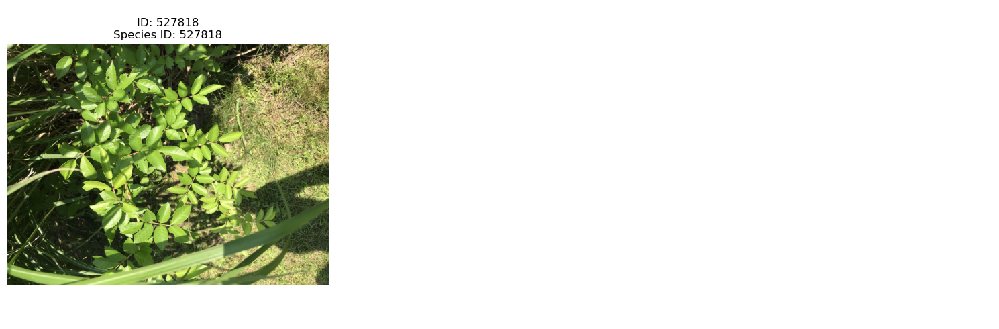


Processing presence ID: 1020954


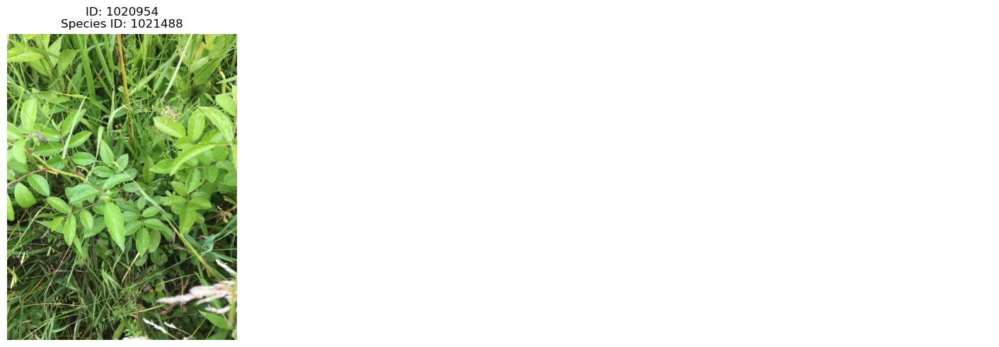


Processing presence ID: 1020531


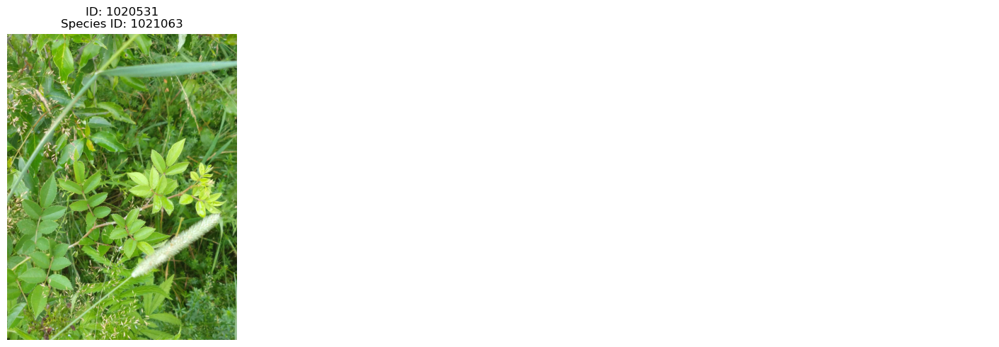


Processing presence ID: 1281975


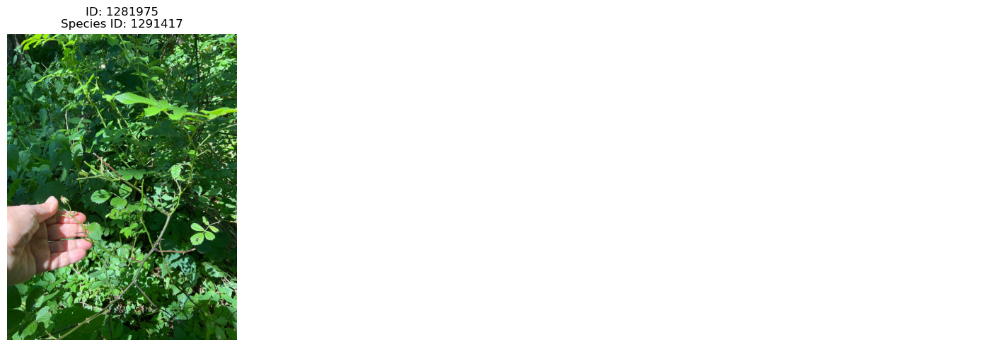


Processing presence ID: 1147647


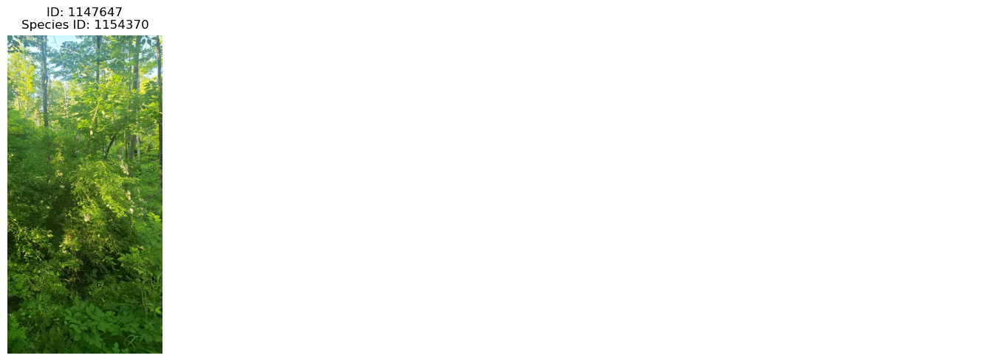


Processing presence ID: 1014324


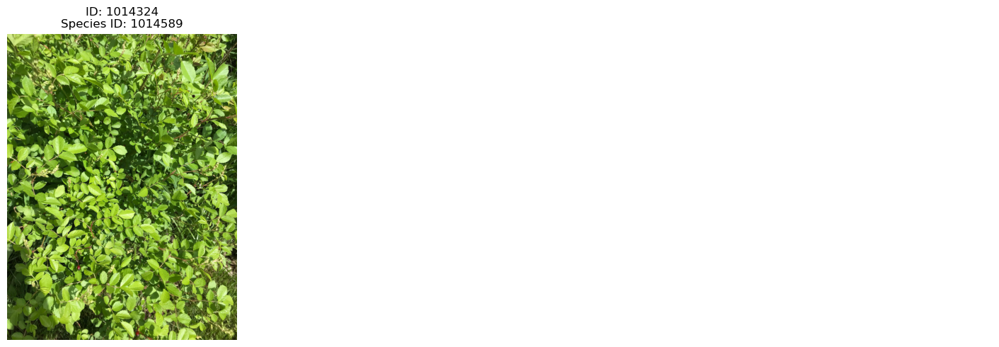


Processing presence ID: 1020120


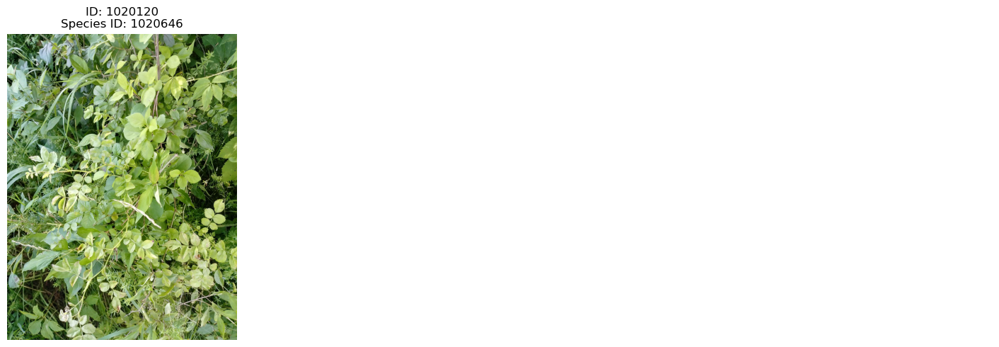


Processing presence ID: 1021081


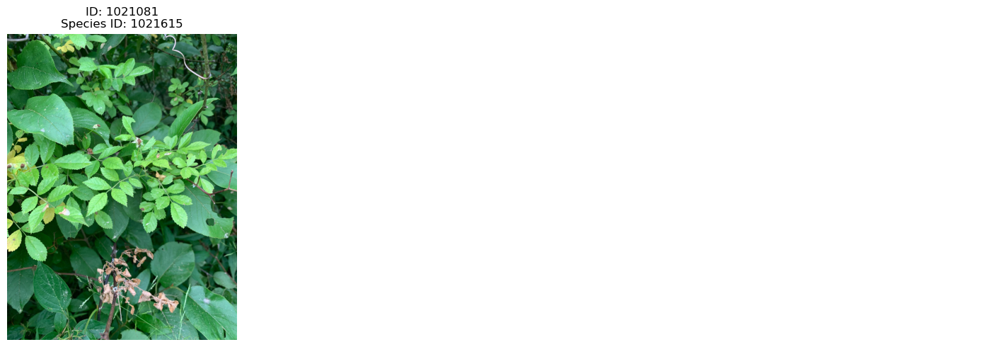


Processing presence ID: 1343196


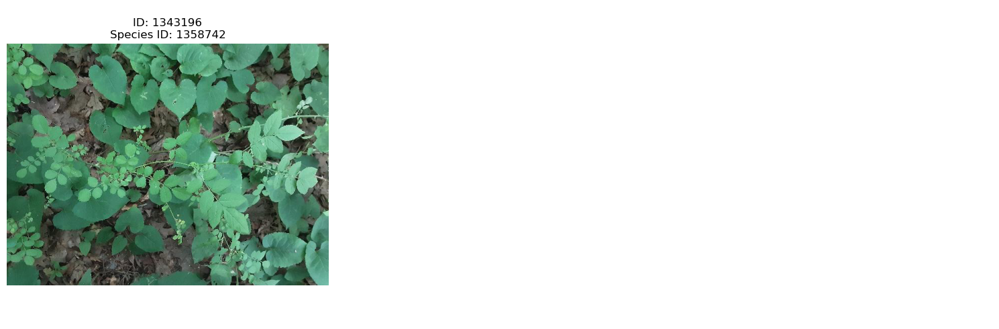


Processing presence ID: 1343210


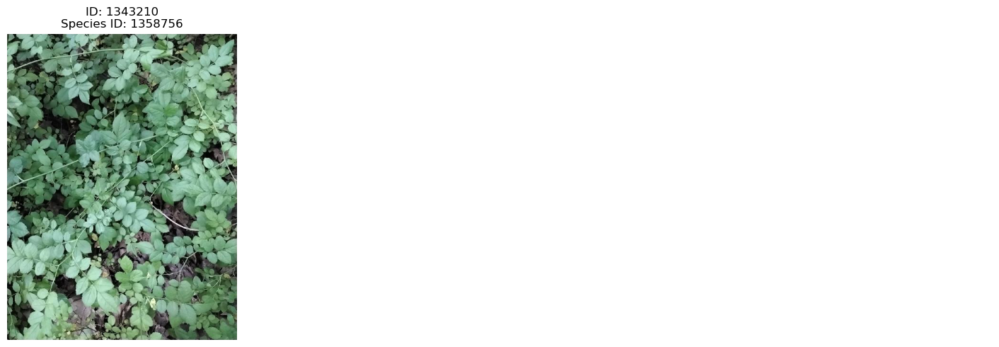

In [70]:
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import math

# Function to get the image from a URL, handling redirects and setting headers
def get_image_from_url(url):
    headers = {
        'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'
    }

    # Perform the GET request with headers and follow redirects
    response = iMapSession.get(url, headers=headers, allow_redirects=True)

    if response.status_code == 200:
        try:
            return Image.open(BytesIO(response.content))
        except Exception as e:
            print(f"Failed to open image. Error: {e}")
            return None
    else:
        print(f"Failed to retrieve image. Status code: {response.status_code}")
        return None

# Function to plot images for each presentSpeciesId in a grid with 3 columns
def plot_images_for_species(imap_dictionary, presence_id):
    species_list = imap_dictionary.get("speciesList", [])
    num_species = len(species_list)
    num_columns = 3
    num_rows = math.ceil(num_species / num_columns)

    fig, axs = plt.subplots(num_rows, num_columns, figsize=(15, 5 * num_rows))
    axs = axs.flatten()  # Flatten the 2D array of axes to 1D for easy iteration

    for i, species in enumerate(species_list):
        img = None

        # Check if the 'photos' list exists and has at least one item
        if "photos" in species and species["photos"]:
            photo_url = species["photos"][0].get("photoUrl", "")

            if photo_url and (photo_url.lower().endswith('.jpg') or photo_url.lower().endswith('.jpeg')):  # Ensure the URL is a valid .jpg or .jpeg
                img = get_image_from_url(photo_url)

        # Display the image if it was successfully retrieved
        if img:
            axs[i].imshow(img)
            axs[i].axis('off')  # Turn off the axis
            axs[i].set_title(f"ID: {presence_id}\nSpecies ID: {species.get('presentSpeciesId')}")
        else:
            axs[i].text(0.5, 0.5, f'ID: {presence_id}\nImage Not Available', horizontalalignment='center', verticalalignment='center')
            axs[i].axis('off')

    # Turn off remaining empty subplots
    for j in range(i + 1, num_rows * num_columns):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

# Function to process multiple presence IDs and plot images (only first 10 records)
def plot_images_for_multiple_species_ids(presence_ids):
    base_url = "https://imapinvasives.natureserve.org/imap/services/presence/"

    # Limit to the first 10 presence IDs
    for presence_id in presence_ids[:10]:
        print(f"\nProcessing presence ID: {presence_id}")
        # Construct the full URL for each presence ID
        full_url = f"{base_url}{presence_id}"

        # Get the iMap record for this presence ID
        imap_record = iMapSession.get(full_url)

        if imap_record.status_code == 200:
            # Convert the response to a dictionary
            imap_dictionary = imap_record.json()

            # Plot images for this presence ID
            plot_images_for_species(imap_dictionary, presence_id)
        else:
            print(f"Failed to retrieve data for presence ID {presence_id}. Status code: {imap_record.status_code}")

# Process only the first 10 presence IDs and plot images
plot_images_for_multiple_species_ids(presence_ids)


### Single text file

In [72]:
# File path to save the text file
file_path = r"C:\Users\tmollick\Documents\iMapInvasives_NYNHP\Datasets\presence_ids_with_photos.txt"

# Writing the list to a text file
with open(file_path, "w") as file:
    for number in presence_ids_with_photos:
        file.write(f"{number}\n")

print(f"File saved successfully as {file_path}")

File saved successfully as C:\Users\tmollick\Documents\iMapInvasives_NYNHP\Datasets\presence_ids_with_photos.txt


### Multiple text files

In [44]:
# File path template to save the split text files
file_path_template = r"C:\Users\tmollick\Documents\iMapInvasives_NYNHP\Datasets\presence_ids_with_photos_{}.txt"

# Number of files to split into
num_files = 5

# Splitting the list into equal parts
chunk_size = len(presence_ids_with_photos) // num_files
chunks = [presence_ids_with_photos[i:i + chunk_size] for i in range(0, len(presence_ids_with_photos), chunk_size)]

# Adjusting for any leftover presence IDs in case the list isn't evenly divisible
if len(chunks) > num_files:
    chunks[-2].extend(chunks[-1])  # Add leftovers to the second-last chunk
    chunks = chunks[:-1]  # Remove the last chunk since it's empty after moving leftovers

# Saving each chunk to a separate text file
for i, chunk in enumerate(chunks, start=1):
    file_path = file_path_template.format(i)
    with open(file_path, "w") as file:
        for number in chunk:
            file.write(f"{number}\n")
    print(f"File saved successfully as {file_path}")


File saved successfully as C:\Users\tmollick\Documents\iMapInvasives_NYNHP\Datasets\presence_ids_with_photos_1.txt
File saved successfully as C:\Users\tmollick\Documents\iMapInvasives_NYNHP\Datasets\presence_ids_with_photos_2.txt
File saved successfully as C:\Users\tmollick\Documents\iMapInvasives_NYNHP\Datasets\presence_ids_with_photos_3.txt
File saved successfully as C:\Users\tmollick\Documents\iMapInvasives_NYNHP\Datasets\presence_ids_with_photos_4.txt
File saved successfully as C:\Users\tmollick\Documents\iMapInvasives_NYNHP\Datasets\presence_ids_with_photos_5.txt


---

### Unconfirmed reports

In [9]:
df2 = pd.read_csv(r"C:\Users\tmollick\Documents\iMapInvasives_NYNHP\Datasets\NY_unconfirmed_imap_records.csv", encoding="ISO-8859-1")
df2.head()

,scientific,common_nam,observatio,observer,species_ty,growth_hab,jurisdicti,county,regional_m,present_sp,habitat_ty,presence_i
0,Adelges tsugae,Hemlock Woolly Adelgid,3/2/2023,Emma Sanzone,Animal,Plant Pest,New York,Schoharie,CRISP,1335032,Terrestrial,1322896
1,Adelges tsugae,Hemlock Woolly Adelgid,3/2/2023,Emma Sanzone,Animal,Plant Pest,New York,Schoharie,CRISP,1335033,Terrestrial,1322897
2,Adelges tsugae,Hemlock Woolly Adelgid,3/2/2023,Emma Sanzone,Animal,Plant Pest,New York,Schoharie,CRISP,1335034,Terrestrial,1322898
3,Artemisia vulgaris,Mugwort,6/24/2022,skyler braeges,Plant,NaN,New York,Wyoming,Western NY,1294592,Terrestrial,1285011
4,Adelges tsugae,Hemlock Woolly Adelgid,3/2/2023,Emma Sanzone,Animal,Plant Pest,New York,Schoharie,CRISP,1335035,Terrestrial,1322899


In [11]:
# Group by 'scientific' and 'common_nam' columns and count occurrences
species_count_df2 = df2.groupby(['scientific', 'common_nam']).size().reset_index(name='Count')

# Sort by 'Count' in descending order and get the top 15 rows
top_species_df2 = species_count_df2.sort_values(by='Count', ascending=False).head(15)

# Display the top 10 rows
top_species_df2

,scientific,common_nam,Count
7,Adelges tsugae,Hemlock Woolly Adelgid,1143
11,Ailanthus altissima,"Tree-of-heaven, Ailanthus",507
132,Lonicera spp (species unknown),Honeysuckle (species unknown),500
219,Rosa multiflora,Multiflora Rose,440
9,Agrilus planipennis,Emerald Ash Borer,328
210,Reynoutria japonica var. japonica : Fallopia j...,"Japanese Knotweed, Japanese Bamboo",304
79,Elaeagnus umbellata,Autumn Olive,241
140,Lymantria dispar,Spongy Moth,216
214,Rhamnus cathartica,Common Buckthorn,202
16,Amynthas-Metaphire spp. (species unknown),"Jumping Worms (species unknown), Asian jumping...",180


In [17]:
# Define the list of target species
target_species = [
    "Adelges tsugae", "Ailanthus altissima", "Rosa multiflora", "Berberis thunbergii",
    "Litylenchus crenatae mccannii", "Reynoutria japonica var. japonica", "Fallopia japonica var. japonica",
    "Lythrum salicaria", "Celastrus orbiculatus", "Alliaria petiolata", "Rhamnus cathartica", "Lycorma delicatula"
]

# Filter the DataFrame to include only the target species
filtered_df2 = df2[df2['scientific'].isin(target_species)]

# Group by 'scientific' and 'common_nam' columns and count occurrences
species_count_df2 = filtered_df2.groupby(['scientific', 'common_nam']).size().reset_index(name='Count')

# Sort by 'Count' in descending order
species_count_df2 = species_count_df2.sort_values(by='Count', ascending=False)

# Display the summary
species_count_df2

,scientific,common_nam,Count
0,Adelges tsugae,Hemlock Woolly Adelgid,1143
2,Ailanthus altissima,"Tree-of-heaven, Ailanthus",507
9,Rosa multiflora,Multiflora Rose,440
8,Rhamnus cathartica,Common Buckthorn,202
6,Litylenchus crenatae mccannii,Beech leaf disease nematode,142
7,Lythrum salicaria,Purple Loosestrife,101
5,Celastrus orbiculatus,Oriental Bittersweet,79
4,Berberis thunbergii,Japanese Barberry,56
3,Alliaria petiolata,Garlic Mustard,37
1,Ailanthus altissima,Tree-of-Heaven,1


In [19]:
import pandas as pd

# Define the list of target species excluding 'Ailanthus altissima' and 'Lycorma delicatula'
selected_species = [
    "Adelges tsugae", "Rosa multiflora", "Berberis thunbergii",
    "Litylenchus crenatae mccannii", "Reynoutria japonica var. japonica",
    "Fallopia japonica var. japonica", "Lythrum salicaria",
    "Celastrus orbiculatus", "Alliaria petiolata", "Rhamnus cathartica"
]

# Filter the DataFrame to include only the selected species
filtered_df = df2[df2['scientific'].isin(selected_species)]

# Select 30 random reports from each species
sampled_df = filtered_df.groupby('scientific').apply(lambda x: x.sample(n=30, random_state=42, replace=False)).reset_index(drop=True)

# Display the selected samples
sampled_df


,scientific,common_nam,observatio,observer,species_ty,growth_hab,jurisdicti,county,regional_m,present_sp,habitat_ty,presence_i
0,Adelges tsugae,Hemlock Woolly Adelgid,4/16/2022,Eli Golden,Animal,Plant Pest,New York,Ulster,Lower Hudson,1278901,Terrestrial,1269970
1,Adelges tsugae,Hemlock Woolly Adelgid,3/18/2024,Magnolia Roosa,Animal,Plant Pest,New York,Saratoga,Capital Region,1410113,Terrestrial,1391980
2,Adelges tsugae,Hemlock Woolly Adelgid,4/23/2022,Oyvind Bo,Animal,Plant Pest,New York,Ulster,Lower Hudson,1279819,Terrestrial,1270879
3,Adelges tsugae,Hemlock Woolly Adelgid,4/30/2022,Jannette Pazer,Animal,Plant Pest,New York,Ulster,Lower Hudson,1280268,Terrestrial,1271303
4,Adelges tsugae,Hemlock Woolly Adelgid,4/23/2022,Damon Lau,Animal,Plant Pest,New York,Ulster,Lower Hudson,1279927,Terrestrial,1270987
...,...,...,...,...,...,...,...,...,...,...,...,...
235,Rosa multiflora,Multiflora Rose,5/7/2021,Abigail Long,Plant,Shrub,New York,Broome,Finger Lakes,1143390,Terrestrial,1136974
236,Rosa multiflora,Multiflora Rose,2/17/2020,Eli Rogers,Plant,Shrub,New York,Ulster,Lower Hudson,1046035,Terrestrial,1042194
237,Rosa multiflora,Multiflora Rose,6/15/2022,Amanda Champion,Plant,Shrub,New York,Tompkins,Finger Lakes,1284414,Terrestrial,1275090
238,Rosa multiflora,Multiflora Rose,1/6/2024,Kristie Munson,Plant,Shrub,New York,Erie,Western NY,1452620,Terrestrial,1438373


In [23]:
# Export the selected records to a CSV file
sampled_df.to_csv(r"C:\Users\tmollick\Documents\iMapInvasives_NYNHP\Datasets\Unconfirmed_reports_30_each_9_species.csv", index=False)

In [27]:
record_ids = pd.read_csv(r"C:\Users\tmollick\Documents\iMapInvasives_NYNHP\Datasets\Unconfirmed_reports_30_each_9_species.csv")
record_ids.head()

,scientific,common_nam,observatio,observer,species_ty,growth_hab,jurisdicti,county,regional_m,present_sp,habitat_ty,presence_i
0,Adelges tsugae,Hemlock Woolly Adelgid,4/16/2022,Eli Golden,Animal,Plant Pest,New York,Ulster,Lower Hudson,1278901,Terrestrial,1269970
1,Adelges tsugae,Hemlock Woolly Adelgid,3/18/2024,Magnolia Roosa,Animal,Plant Pest,New York,Saratoga,Capital Region,1410113,Terrestrial,1391980
2,Adelges tsugae,Hemlock Woolly Adelgid,4/23/2022,Oyvind Bo,Animal,Plant Pest,New York,Ulster,Lower Hudson,1279819,Terrestrial,1270879
3,Adelges tsugae,Hemlock Woolly Adelgid,4/30/2022,Jannette Pazer,Animal,Plant Pest,New York,Ulster,Lower Hudson,1280268,Terrestrial,1271303
4,Adelges tsugae,Hemlock Woolly Adelgid,4/23/2022,Damon Lau,Animal,Plant Pest,New York,Ulster,Lower Hudson,1279927,Terrestrial,1270987


In [29]:
pre_ID = record_ids["presence_i"].tolist()  # Convert Series to list

In [31]:
import requests

imap_site = "imapinvasives"
iMap_username = "tmollick@esf.edu"
iMap_password = "SUNY.esf@130436"

login_url = r"https://{0}.natureserve.org/imap/j_spring_security_check".format(imap_site)

# Attempt to log in
print("\nAttempting to authenticate with: {0}".format(login_url))
iMapSession = requests.Session()  # This is a global variable accessed in later functions
login_response = iMapSession.post(login_url,{'j_username':iMap_username,'j_password':iMap_password})
login_response_message = "\nlogin response: {0}".format(login_response.status_code)
print(login_response_message)
login_response.raise_for_status()

# Attempt to access a record to check if log-in was successful
test_aoi_url = r"https://{0}.natureserve.org/imap/services/aoi/new".format(imap_site)
test_aoi_record = iMapSession.get(test_aoi_url)
test_aoi_record_message = "\nTest record access response: {0}".format(test_aoi_record.status_code)
print(test_aoi_record_message)

if test_aoi_record.status_code == 403:
    print("\nResponse Code 403 is most likely the result of an incorrectly entered iMap username or password.  It may also be caused by logging in as a user with insufficient permissions.")

test_aoi_record.raise_for_status()


Attempting to authenticate with: https://imapinvasives.natureserve.org/imap/j_spring_security_check

login response: 200

Test record access response: 200


In [33]:
base_url = f"https://{imap_site}.natureserve.org/imap/services/presence/"

# List to store presence IDs with at least one species having a photo
presence_ids_with_photos = []

# Iterate over each presence ID
for presence_id in pre_ID:
    # Construct the full URL for each presence ID
    full_url = f"{base_url}{presence_id}"
    
    # Get the iMap record for this presence ID
    try:
        imap_record = iMapSession.get(full_url)  # Use the session to maintain authentication
        
        # Check if the request was successful
        if imap_record.status_code == 200:
            # Convert the response to a dictionary
            imap_dictionary = imap_record.json()
            
            # Extract all presentSpeciesId values from the speciesList
            present_species_ids = [species.get("presentSpeciesId") for species in imap_dictionary.get("speciesList", [])]
            
            # Filter out any None values just in case
            present_species_ids = [id for id in present_species_ids if id is not None]
            
            # Check if any presentSpeciesId has hasPhotoInd == True
            has_photo = any(species.get("hasPhotoInd") == True for species in imap_dictionary.get("speciesList", []))
            
            # If at least one presentSpeciesId has a photo, add the presence ID to the list
            if has_photo:
                presence_ids_with_photos.append(presence_id)
    
    except requests.exceptions.RequestException as e:
        print(f"An error occurred while processing presence ID {presence_id}: {e}")

In [37]:
print(presence_ids_with_photos)

[1269970, 1391980, 1270879, 1271303, 1270987, 1270055, 1269928, 1323078, 1271037, 1271014, 1270929, 1351159, 1269959, 1269940, 1410198, 1271255, 1271035, 1249866, 1322554, 1271432, 1269887, 1271455, 1386214, 1322052, 1271224, 1323089, 1158522, 1270880, 1270945, 1270758, 1280894, 1045434, 1042327, 1435275, 1393477, 1413844, 1042333, 1417257, 1408840, 1341632, 1042362, 1271429, 1044113, 1331696, 1042546, 1409368, 1329118, 1443082, 1042329, 1042550, 1041713, 1441700, 1344384, 1041714, 1443662, 1230822, 1041716, 1331716, 1411656, 1441222, 1375427, 1269831, 1406991, 1157741, 1163998, 1443075, 1417261, 1444125, 1157735, 1389202, 1324094, 1410146, 1351791, 425375, 1163662, 1269855, 1388756, 1443092, 1390119, 1434743, 1444128, 1443080, 1390094, 510330, 1390065, 1390083, 1271094, 1443571, 1438376, 1271832, 1157793, 1390067, 1272705, 1146170, 1275086, 1037215, 1442164, 450686, 1042201, 1338922, 1279659, 1438606, 1281910, 1441690, 1335107, 1438378, 1417259, 1411655, 1298970, 1036859, 1438549, 450

In [39]:
presence_ids = presence_ids_with_photos


Processing presence ID: 1269970


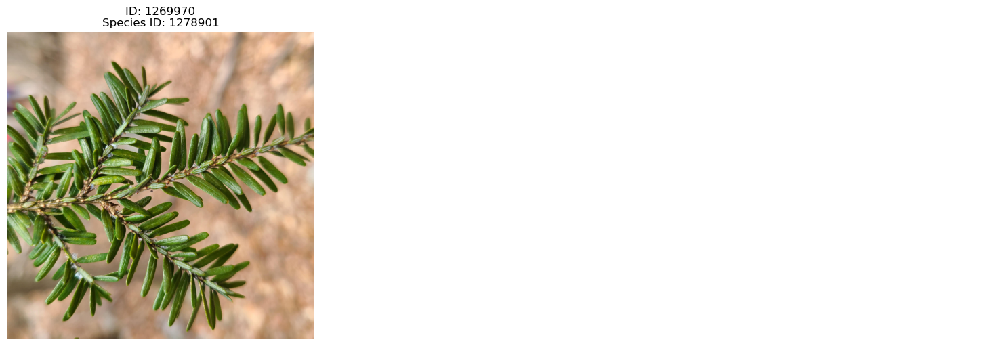


Processing presence ID: 1391980


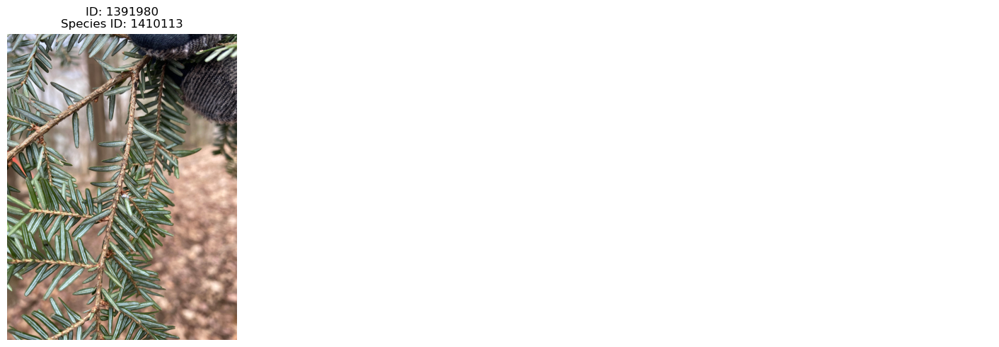


Processing presence ID: 1270879


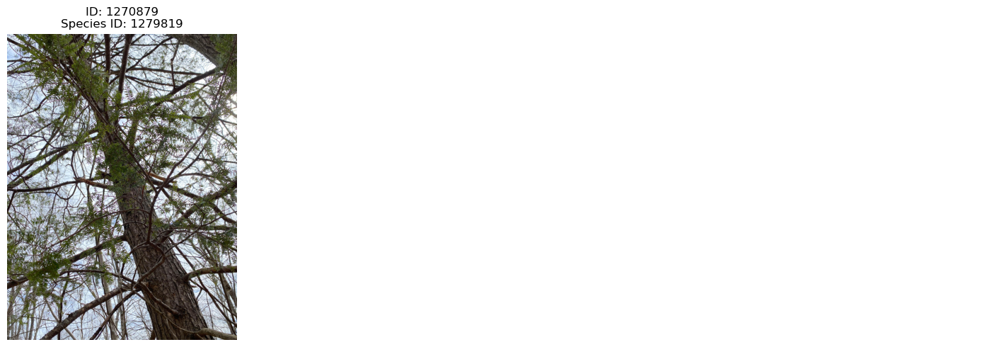


Processing presence ID: 1271303


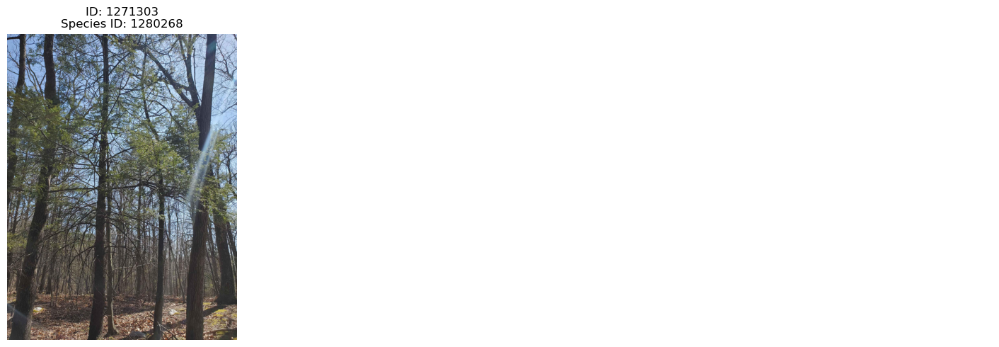


Processing presence ID: 1270987


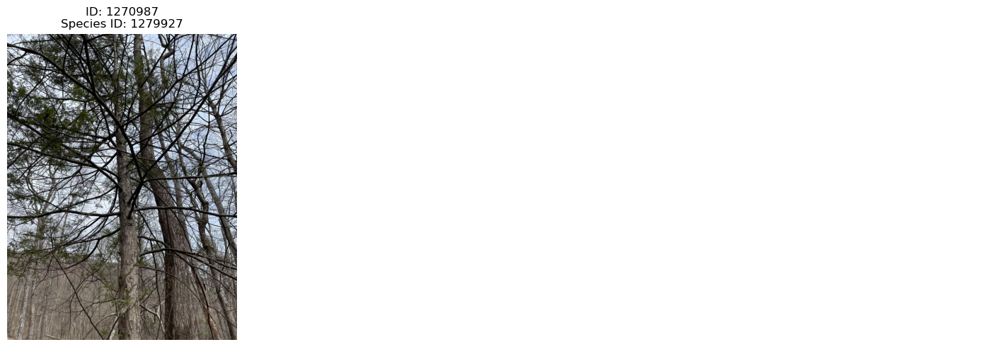


Processing presence ID: 1270055


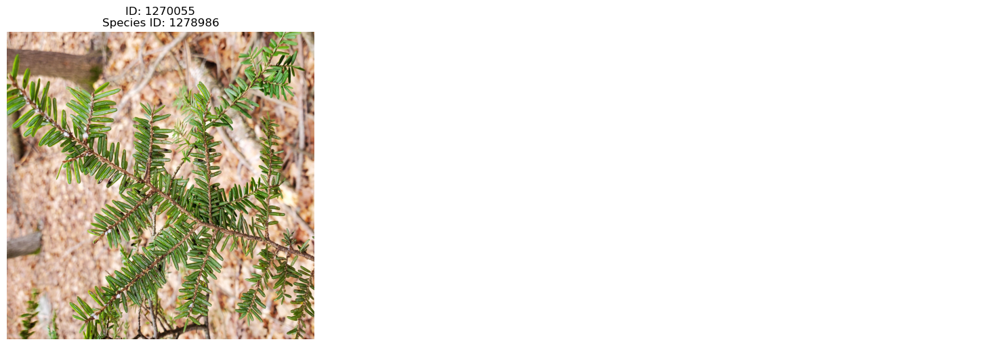


Processing presence ID: 1269928


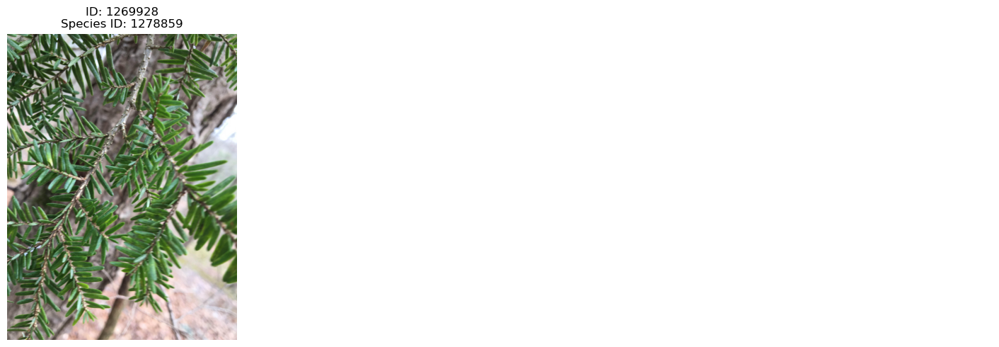


Processing presence ID: 1323078


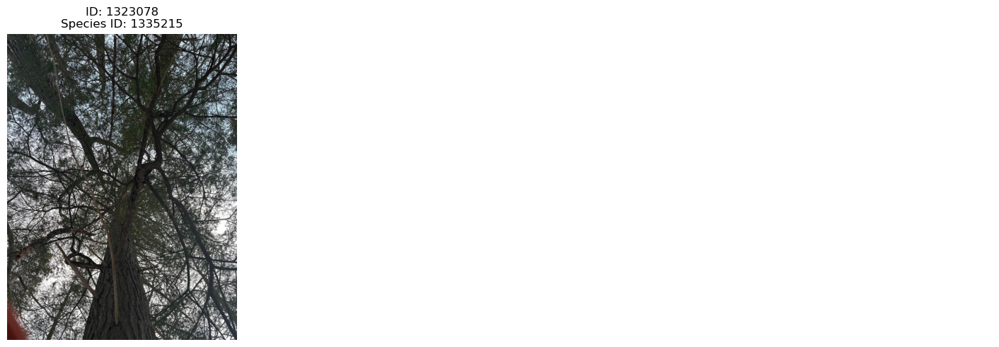


Processing presence ID: 1271037


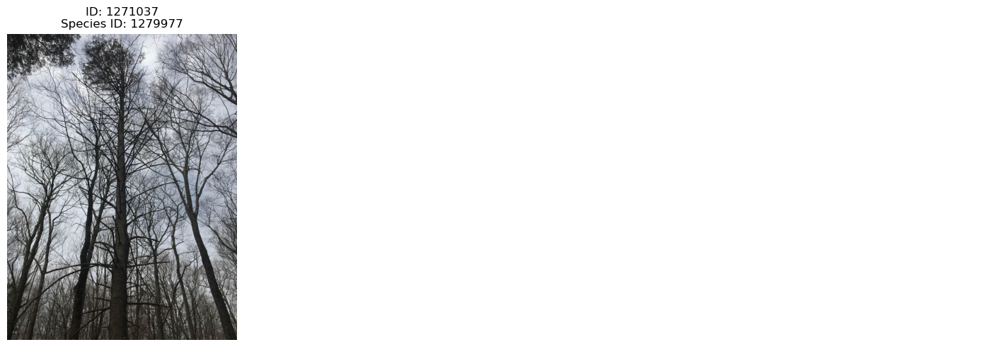


Processing presence ID: 1271014


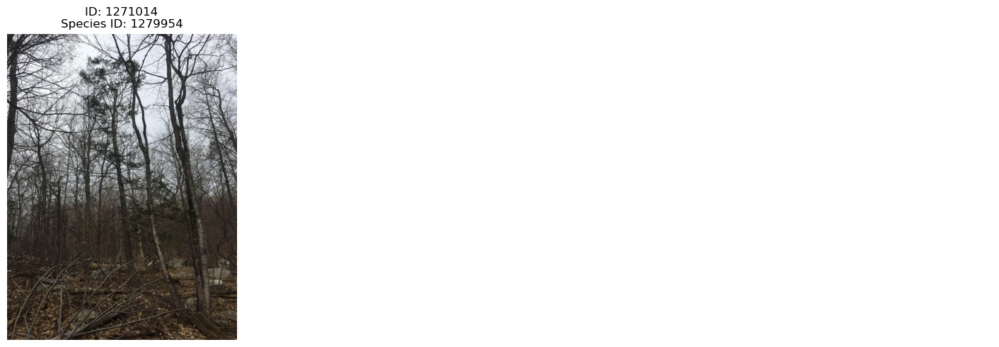

In [41]:
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import math

# Function to get the image from a URL, handling redirects and setting headers
def get_image_from_url(url):
    headers = {
        'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'
    }

    # Perform the GET request with headers and follow redirects
    response = iMapSession.get(url, headers=headers, allow_redirects=True)

    if response.status_code == 200:
        try:
            return Image.open(BytesIO(response.content))
        except Exception as e:
            print(f"Failed to open image. Error: {e}")
            return None
    else:
        print(f"Failed to retrieve image. Status code: {response.status_code}")
        return None

# Function to plot images for each presentSpeciesId in a grid with 3 columns
def plot_images_for_species(imap_dictionary, presence_id):
    species_list = imap_dictionary.get("speciesList", [])
    num_species = len(species_list)
    num_columns = 3
    num_rows = math.ceil(num_species / num_columns)

    fig, axs = plt.subplots(num_rows, num_columns, figsize=(15, 5 * num_rows))
    axs = axs.flatten()  # Flatten the 2D array of axes to 1D for easy iteration

    for i, species in enumerate(species_list):
        img = None

        # Check if the 'photos' list exists and has at least one item
        if "photos" in species and species["photos"]:
            photo_url = species["photos"][0].get("photoUrl", "")

            if photo_url and (photo_url.lower().endswith('.jpg') or photo_url.lower().endswith('.jpeg')):  # Ensure the URL is a valid .jpg or .jpeg
                img = get_image_from_url(photo_url)

        # Display the image if it was successfully retrieved
        if img:
            axs[i].imshow(img)
            axs[i].axis('off')  # Turn off the axis
            axs[i].set_title(f"ID: {presence_id}\nSpecies ID: {species.get('presentSpeciesId')}")
        else:
            axs[i].text(0.5, 0.5, f'ID: {presence_id}\nImage Not Available', horizontalalignment='center', verticalalignment='center')
            axs[i].axis('off')

    # Turn off remaining empty subplots
    for j in range(i + 1, num_rows * num_columns):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

# Function to process multiple presence IDs and plot images (only first 10 records)
def plot_images_for_multiple_species_ids(presence_ids):
    base_url = "https://imapinvasives.natureserve.org/imap/services/presence/"

    # Limit to the first 10 presence IDs
    for presence_id in presence_ids[:10]:
        print(f"\nProcessing presence ID: {presence_id}")
        # Construct the full URL for each presence ID
        full_url = f"{base_url}{presence_id}"

        # Get the iMap record for this presence ID
        imap_record = iMapSession.get(full_url)

        if imap_record.status_code == 200:
            # Convert the response to a dictionary
            imap_dictionary = imap_record.json()

            # Plot images for this presence ID
            plot_images_for_species(imap_dictionary, presence_id)
        else:
            print(f"Failed to retrieve data for presence ID {presence_id}. Status code: {imap_record.status_code}")

# Process only the first 10 presence IDs and plot images
plot_images_for_multiple_species_ids(presence_ids)


In [43]:
# File path to save the text file
file_path = r"C:\Users\tmollick\Documents\iMapInvasives_NYNHP\Datasets\presence_ids_with_photos.txt"

# Writing the list to a text file
with open(file_path, "w") as file:
    for number in presence_ids_with_photos:
        file.write(f"{number}\n")

print(f"File saved successfully as {file_path}")

File saved successfully as C:\Users\tmollick\Documents\iMapInvasives_NYNHP\Datasets\presence_ids_with_photos.txt
